In [1]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))
%matplotlib inline

import dynamo as dyn
dyn.get_all_dependencies_version()

package,dynamo-release,pre-commit,cvxopt,trimap,numdifftools,colorcet,python-igraph,pynndescent,hdbscan,loompy,matplotlib,networkx,numba,numpy,pandas,scikit-learn,scipy,seaborn,setuptools,statsmodels,tqdm,umap-learn
version,1.0.0,2.11.1,1.2.6,1.4.3.dev1,0.9.39,2.0.6,0.9.0,0.5.2,0.8.27,3.0.6,3.4.1,2.5.1,0.53.1,1.20.3,1.2.3,0.23.2,1.6.1,0.11.1,54.2.0,0.12.2,4.58.0,0.5.1


In [2]:
# simulate ggplot2 plotting styple with white background

dyn.configuration.set_figure_params('dynamo', background='white')  

In [3]:
adata = dyn.sample_data.BM()


|-----> Downloading data to ./data/SCG71.loom
/home/xqiu/python37test-env/lib/python3.7/site-packages/numba/np/ufunc/parallel.py:365: NumbaWarning: The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 9107. The TBB threading layer is disabled.
  warnings.warn(problem)


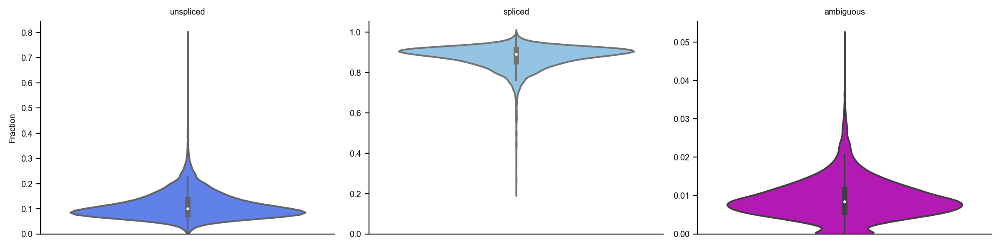

In [4]:
dyn.pl.show_fraction(adata)


In [5]:
dyn.pp.recipe_monocle(adata, n_top_genes=1000)


|-----> apply Monocole recipe to adata...
|-----> <insert> pp to uns in AnnData Object.
|-----------> <insert> has_splicing to uns['pp'] in AnnData Object.
|-----------> <insert> has_labling to uns['pp'] in AnnData Object.
|-----------> <insert> splicing_labeling to uns['pp'] in AnnData Object.
|-----------> <insert> has_protein to uns['pp'] in AnnData Object.
|-----> ensure all cell and variable names unique.
|-----> ensure all data in different layers in csr sparse matrix format.
|-----> ensure all labeling data properly collapased
|-----------> <insert> tkey to uns['pp'] in AnnData Object.
|-----------> <insert> experiment_type to uns['pp'] in AnnData Object.
|-----> filtering cells...
|-----> filtering genes...
|-----> calculating size factor...
|-----> selecting genes...
|-----> <insert> frac to var in AnnData Object.
|-----> size factor normalizing the data, followed by log1p transformation.
|-----> applying PCA ...
|-----> <insert> pca_fit to uns in AnnData Object.
|-----> <inse

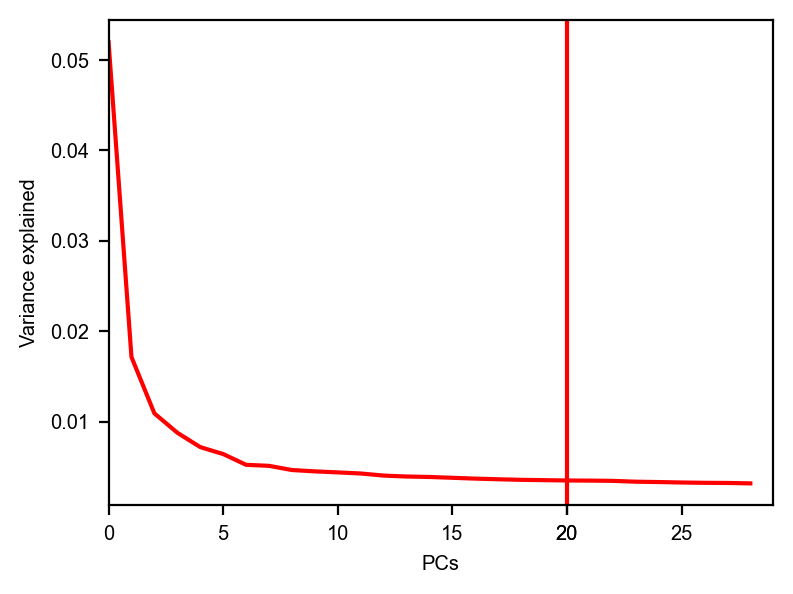

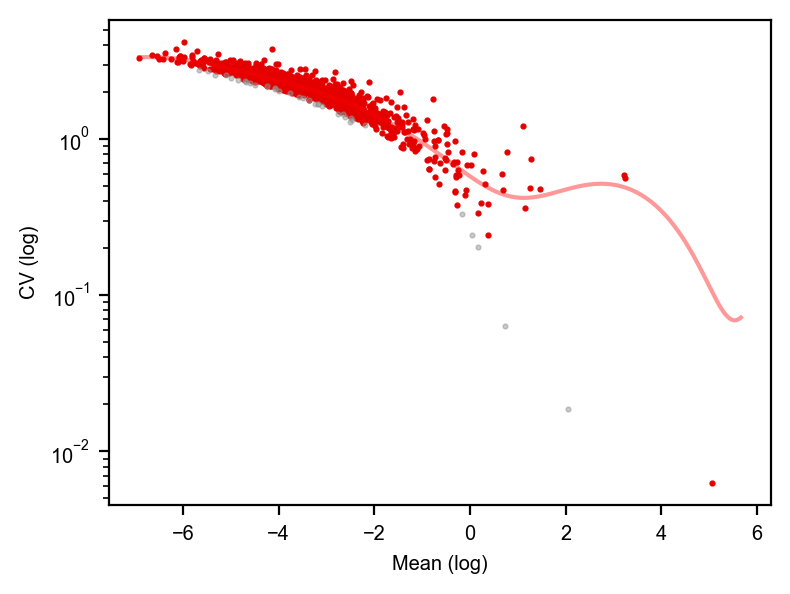

In [6]:
dyn.pl.variance_explained(adata)
dyn.pl.feature_genes(adata)

In [7]:
# dyn.tl.dynamics(adata, model='deterministic', copy=True)
dyn.tl.dynamics(adata, model='stochastic') # , copy=True 
# dyn.tl.dynamics(adata, model='stochastic', est_method='negbin', copy=True)


|-----> calculating first/second moments...
|-----> [moments calculation] in progress: 100.0000%
|-----> [moments calculation] finished [56.5319s]
/home/xqiu/python37test-env/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
estimating gamma: 100%|██████████| 1000/1000 [01:12<00:00, 13.80it/s]


AnnData object with n_obs × n_vars = 6667 × 24421
    obs: 'nGenes', 'nCounts', 'pMito', 'use_for_pca', 'unspliced_Size_Factor', 'initial_unspliced_cell_size', 'Size_Factor', 'initial_cell_size', 'spliced_Size_Factor', 'initial_spliced_cell_size', 'ntr', 'cell_cycle_phase'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'nCells', 'nCounts', 'pass_basic_filter', 'log_m', 'log_cv', 'score', 'use_for_pca', 'frac', 'ntr', 'beta', 'gamma', 'half_life', 'alpha_b', 'alpha_r2', 'gamma_b', 'gamma_r2', 'gamma_logLL', 'delta_b', 'delta_r2', 'bs', 'bf', 'uu0', 'ul0', 'su0', 'sl0', 'U0', 'S0', 'total0', 'use_for_dynamics'
    uns: 'pp', 'velocyto_SVR', 'PCs', 'explained_variance_ratio_', 'pca_mean', 'pca_fit', 'feature_selection', 'cell_phase_genes', 'dynamics'
    obsm: 'X_pca', 'X', 'cell_cycle_scores'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced', 'X_unspliced', 'X_spliced', 'M_u', 'M_uu', 'M_s', 'M_us', 'M_ss', 'velocity_S'
    obsp: 'moments_con'

In [8]:
dyn.tl.reduceDimension(adata)


|-----> retrive data for non-linear dimension reduction...
|-----> perform umap...
|-----> [dimension_reduction projection] in progress: 100.0000%
|-----> [dimension_reduction projection] finished [43.6023s]


In [9]:
dyn.tl.cell_velocities(adata)


|-----> [calculating transition matrix via pearson kernel with sqrt transform.] in progress: 100.0000%
|-----> [calculating transition matrix via pearson kernel with sqrt transform.] finished [5.6537s]
|-----> [projecting velocity vector to low dimensional embedding] in progress: 100.0000%
|-----> [projecting velocity vector to low dimensional embedding] finished [2.5961s]


AnnData object with n_obs × n_vars = 6667 × 24421
    obs: 'nGenes', 'nCounts', 'pMito', 'use_for_pca', 'unspliced_Size_Factor', 'initial_unspliced_cell_size', 'Size_Factor', 'initial_cell_size', 'spliced_Size_Factor', 'initial_spliced_cell_size', 'ntr', 'cell_cycle_phase'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'nCells', 'nCounts', 'pass_basic_filter', 'log_m', 'log_cv', 'score', 'use_for_pca', 'frac', 'ntr', 'beta', 'gamma', 'half_life', 'alpha_b', 'alpha_r2', 'gamma_b', 'gamma_r2', 'gamma_logLL', 'delta_b', 'delta_r2', 'bs', 'bf', 'uu0', 'ul0', 'su0', 'sl0', 'U0', 'S0', 'total0', 'use_for_dynamics', 'use_for_transition'
    uns: 'pp', 'velocyto_SVR', 'PCs', 'explained_variance_ratio_', 'pca_mean', 'pca_fit', 'feature_selection', 'cell_phase_genes', 'dynamics', 'neighbors', 'umap_fit', 'grid_velocity_umap'
    obsm: 'X_pca', 'X', 'cell_cycle_scores', 'X_umap', 'velocity_umap'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced', 'X_unspliced', 'X_spliced', 

In [10]:
gene_list=adata.var.index[adata.var.use_for_transition].values[:3]

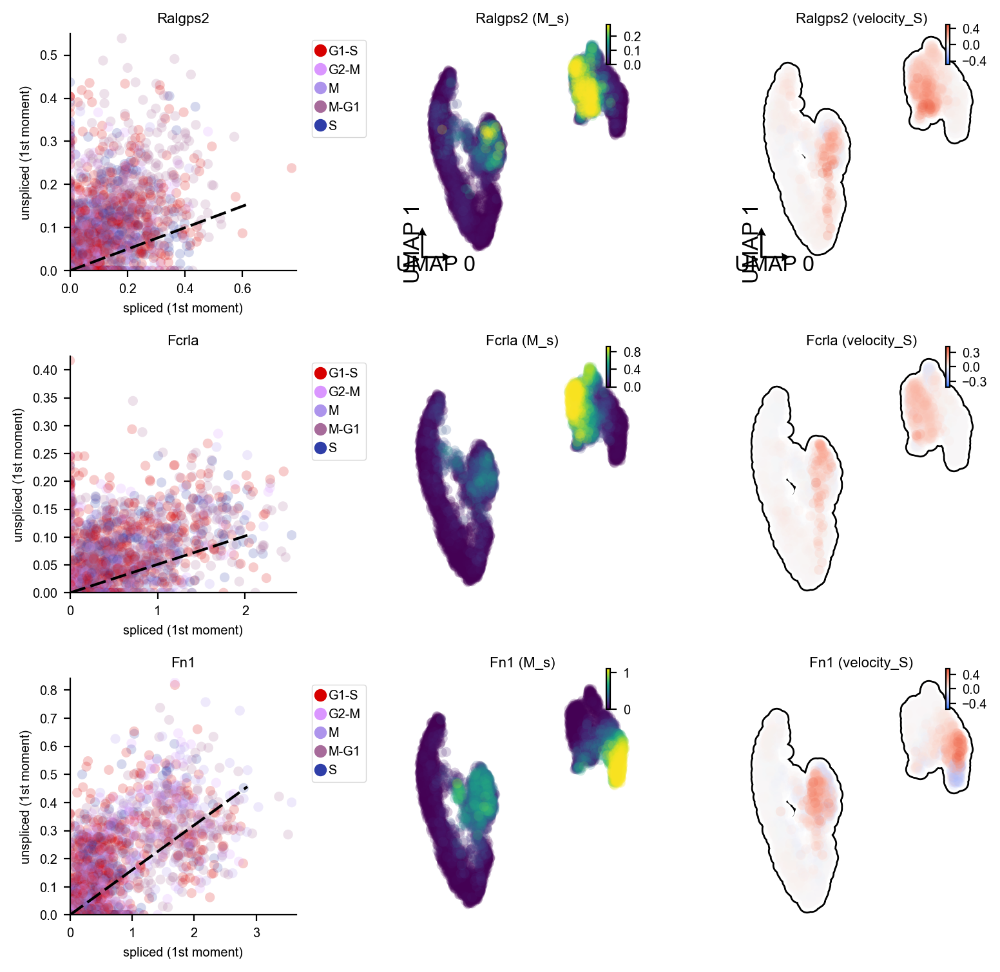

In [11]:
dyn.pl.phase_portraits(adata, genes=gene_list, ncols=3, figsize=(3, 3), basis='umap', show_quiver=False)

/home/xqiu/python37test-env/lib/python3.7/site-packages/dynamo_release-1.0.0-py3.7.egg/dynamo/plot/scVectorField.py:536: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


<Figure size 600x400 with 0 Axes>

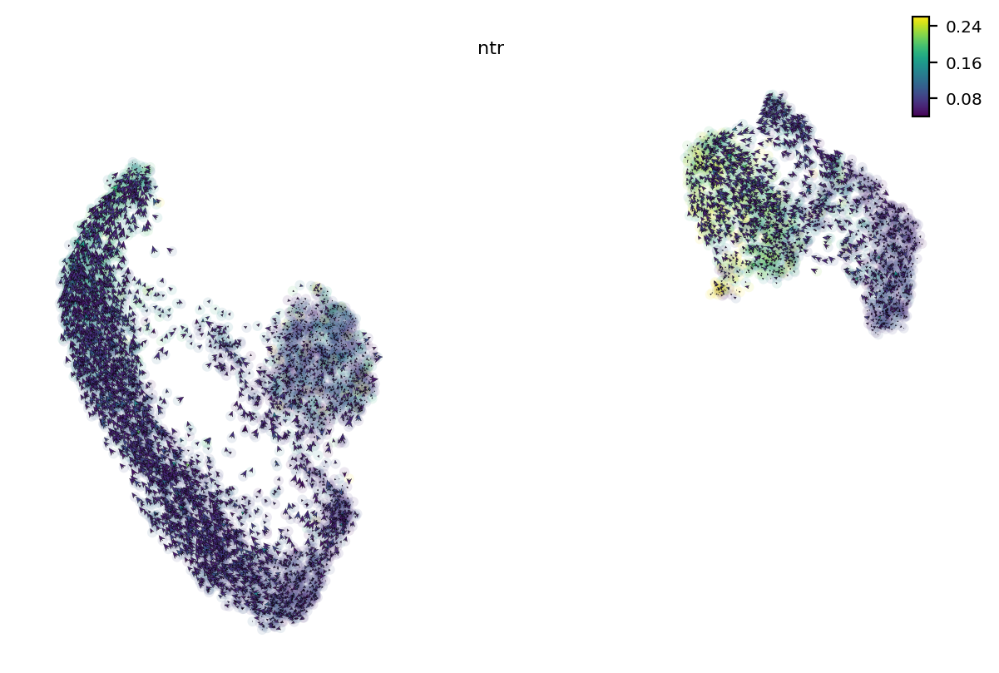

In [12]:
dyn.pl.cell_wise_vectors(adata, basis='umap', quiver_size=4, quiver_length=4, pointsize=0.1) # ['GRIA3', 'LINC00982', 'AFF2']



/home/xqiu/python37test-env/lib/python3.7/site-packages/dynamo_release-1.0.0-py3.7.egg/dynamo/plot/scVectorField.py:838: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


<Figure size 600x400 with 0 Axes>

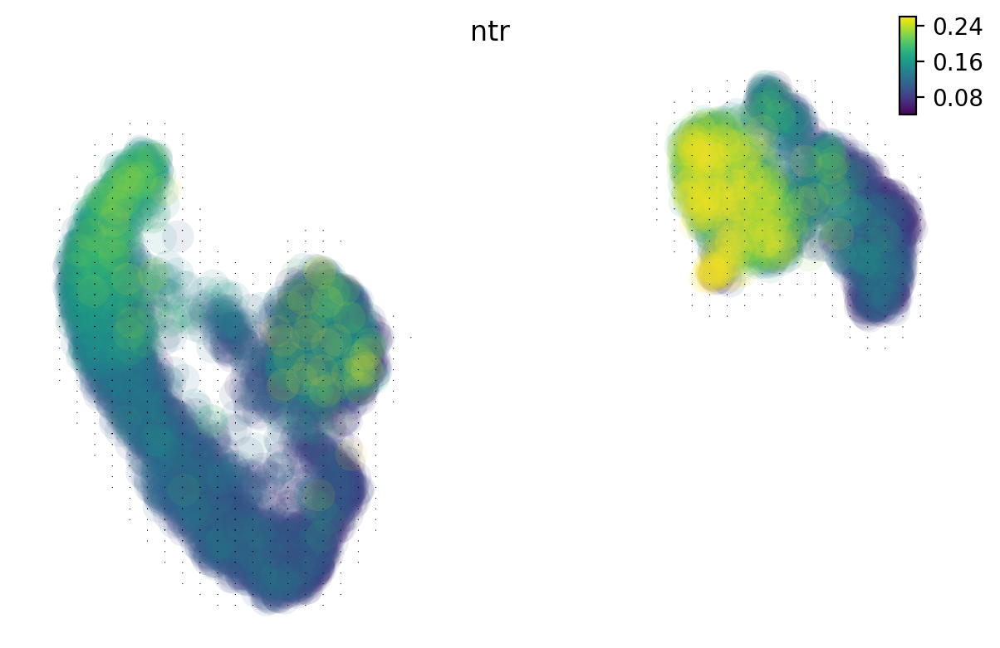

In [13]:
dyn.pl.grid_vectors(adata, basis='umap', method='gaussian')

/home/xqiu/python37test-env/lib/python3.7/site-packages/dynamo_release-1.0.0-py3.7.egg/dynamo/plot/scVectorField.py:1147: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


<Figure size 600x400 with 0 Axes>

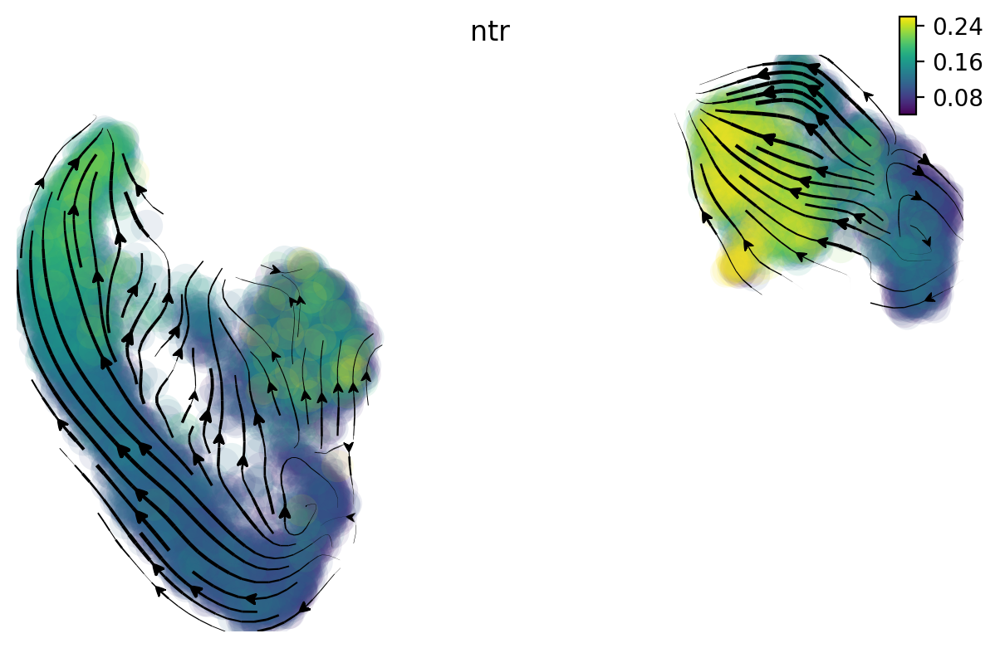

In [14]:

dyn.pl.streamline_plot(adata,  basis='umap') 

/home/xqiu/python37test-env/lib/python3.7/site-packages/dynamo_release-1.0.0-py3.7.egg/dynamo/plot/scVectorField.py:1147: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


<Figure size 600x400 with 0 Axes>

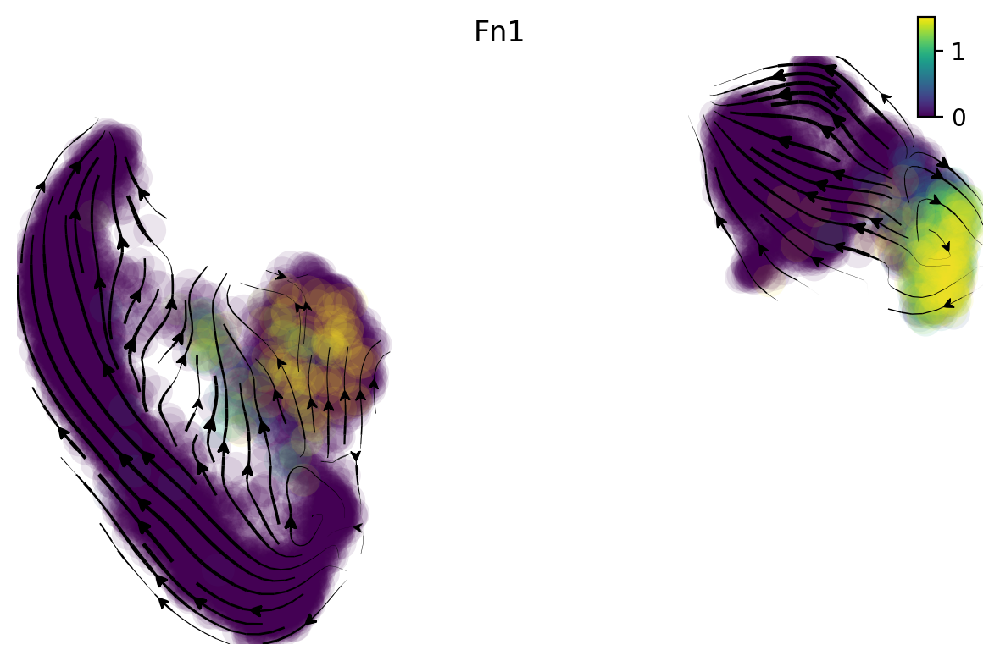

In [15]:
dyn.pl.streamline_plot(adata, color=adata.var.index[adata.var.use_for_transition][:1], basis='umap') 

In [16]:
dyn.vf.VectorField(adata, basis='umap', dims=[0, 1])


|-----> vectorfield calculation begins...
|-----> Retrieve X and V based on basis: UMAP. 
        Vector field will be learned in the UMAP space.
|-----> Generating high dimensional grids and convert into a row matrix.
|-----> Learning vector field with method: sparsevfc.
|-----> [SparseVFC] begins...
|-----> Sampling control points based on data velocity magnitude...
|-----> [SparseVFC] in progress: 100.0000%
|-----> [SparseVFC] finished [14.8186s]
|-----> <insert> velocity_umap_SparseVFC to obsm in AnnData Object.
|-----> <insert> X_umap_SparseVFC to obsm in AnnData Object.
|-----> <insert> VecFld_umap to uns in AnnData Object.
|-----> <insert> control_point_umap to obs in AnnData Object.
|-----> <insert> inlier_prob_umap to obs in AnnData Object.
|-----> <insert> obs_vf_angle_umap to obs in AnnData Object.
|-----> [VectorField] in progress: 100.0000%
|-----> [VectorField] finished [16.6679s]


|-----> Vector field for umap is but its topography is not mapped. Mapping topography now ...
/home/xqiu/python37test-env/lib/python3.7/site-packages/dynamo_release-1.0.0-py3.7.egg/dynamo/plot/topography.py:547: UserWarning: You passed a edgecolor/edgecolors ('black') for an unfilled marker (<matplotlib.markers.MarkerStyle object at 0x7f53242a76d0>).  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  zorder=5,


<Figure size 600x400 with 0 Axes>

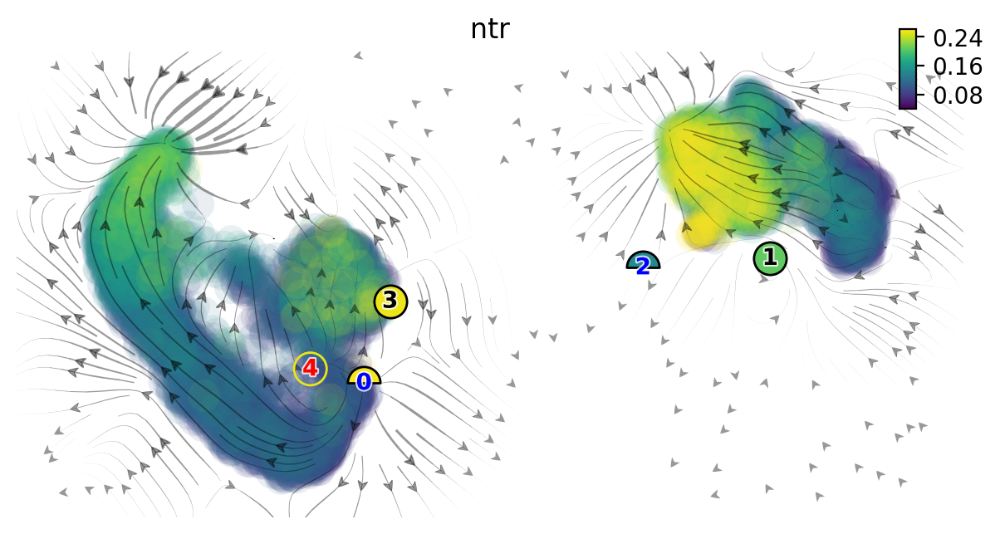

In [17]:
dyn.pl.topography(adata, basis='umap', ncols=1)

In [18]:
dyn.configuration.set_figure_params('dynamo', background='black')  

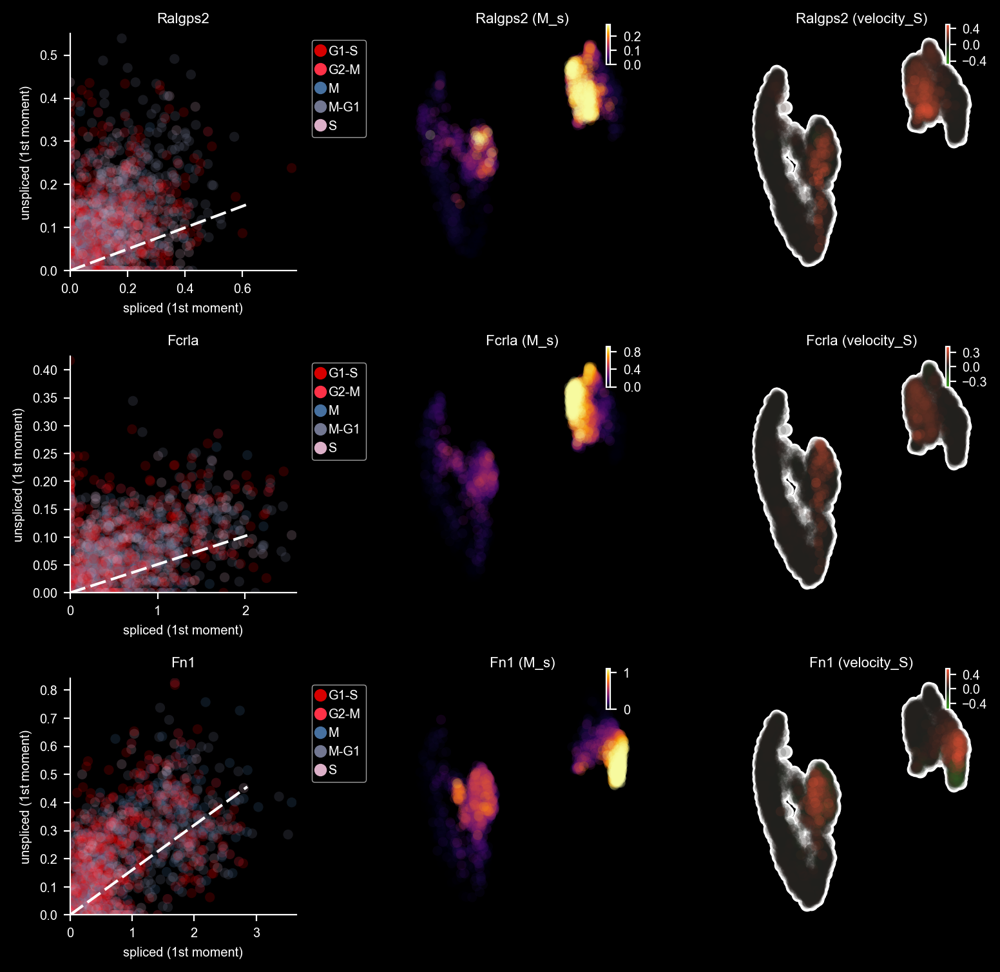

/home/xqiu/python37test-env/lib/python3.7/site-packages/dynamo_release-1.0.0-py3.7.egg/dynamo/plot/scVectorField.py:536: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


<Figure size 600x400 with 0 Axes>

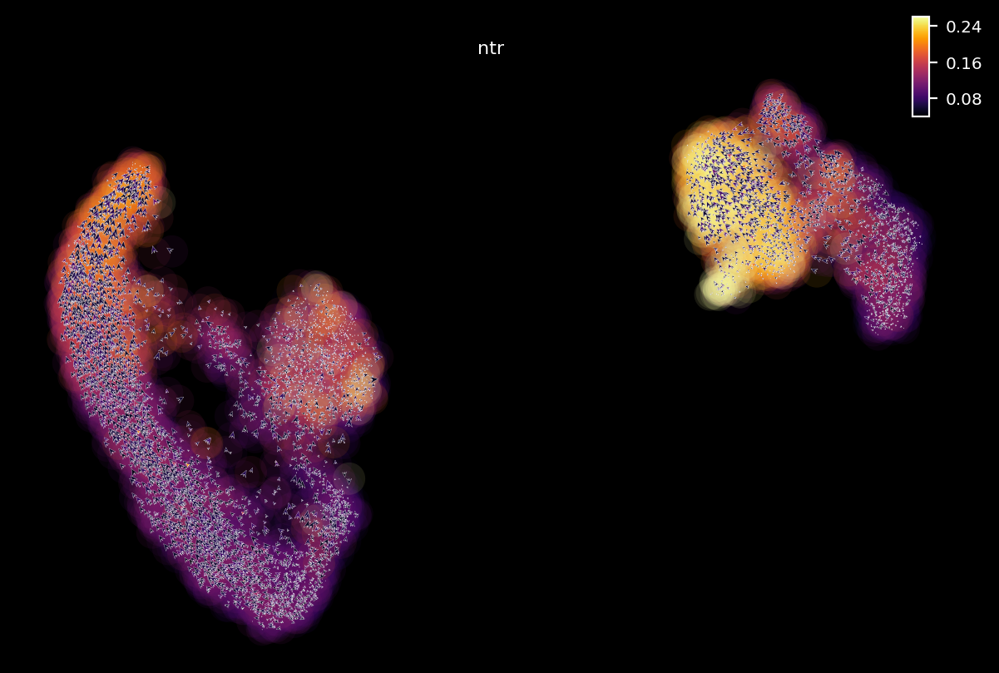

/home/xqiu/python37test-env/lib/python3.7/site-packages/dynamo_release-1.0.0-py3.7.egg/dynamo/plot/scVectorField.py:838: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


<Figure size 600x400 with 0 Axes>

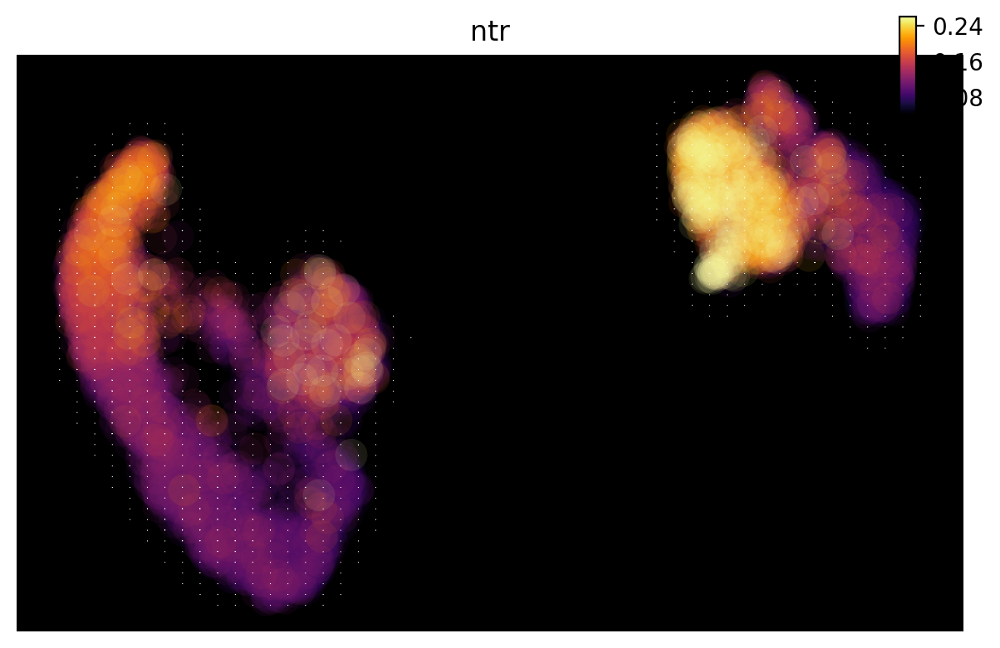

/home/xqiu/python37test-env/lib/python3.7/site-packages/dynamo_release-1.0.0-py3.7.egg/dynamo/plot/scVectorField.py:1147: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


<Figure size 600x400 with 0 Axes>

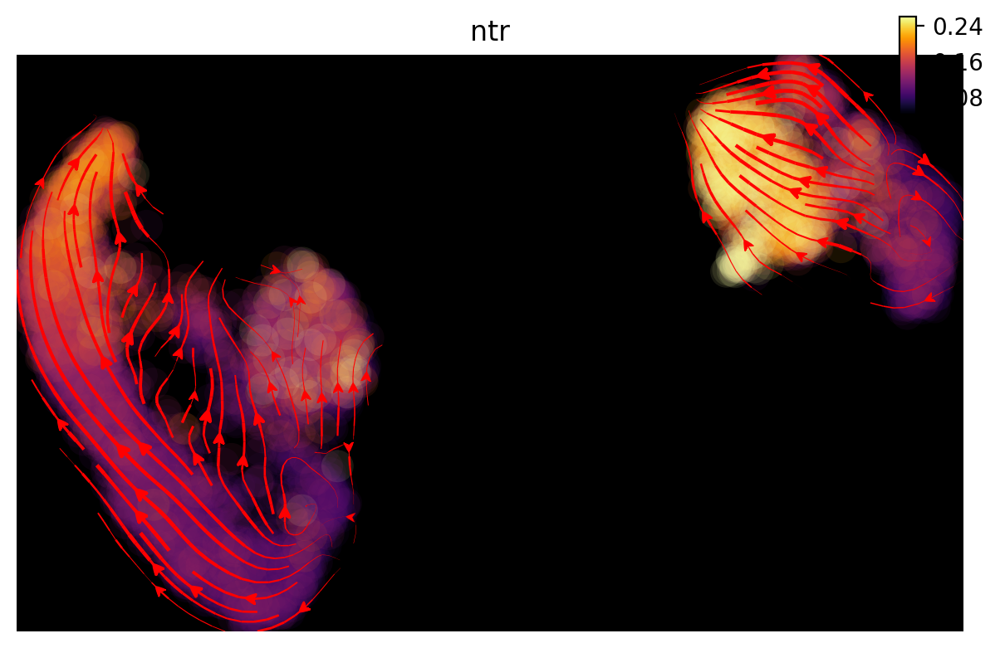

/home/xqiu/python37test-env/lib/python3.7/site-packages/dynamo_release-1.0.0-py3.7.egg/dynamo/plot/topography.py:547: UserWarning: You passed a edgecolor/edgecolors ('white') for an unfilled marker (<matplotlib.markers.MarkerStyle object at 0x7f55286f7750>).  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  zorder=5,


<Figure size 600x400 with 0 Axes>

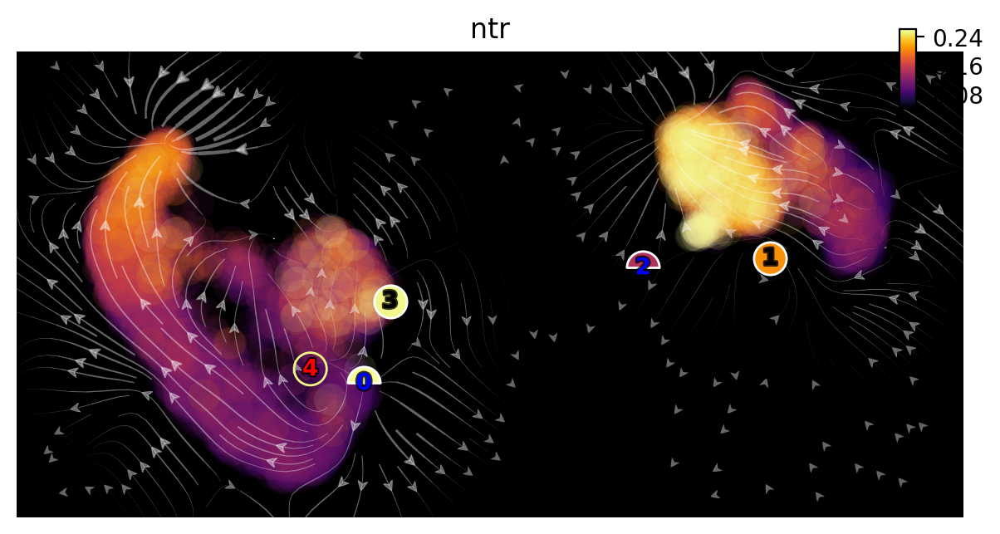

In [19]:
dyn.pl.phase_portraits(adata, genes=gene_list, ncols=3, figsize=(3, 3), basis='umap', show_quiver=False, show_arrowed_spines=False)

dyn.pl.cell_wise_vectors(adata, basis='umap', quiver_size=4, quiver_length=4, background='black') # ['GRIA3', 'LINC00982', 'AFF2']

dyn.pl.grid_vectors(adata, basis='umap', method='gaussian', background='black')

dyn.pl.streamline_plot(adata, basis='umap', background='black') 

dyn.pl.topography(adata, basis='umap', ncols=1, background='black')



In [20]:
adata

AnnData object with n_obs × n_vars = 6667 × 24421
    obs: 'nGenes', 'nCounts', 'pMito', 'use_for_pca', 'unspliced_Size_Factor', 'initial_unspliced_cell_size', 'Size_Factor', 'initial_cell_size', 'spliced_Size_Factor', 'initial_spliced_cell_size', 'ntr', 'cell_cycle_phase', 'control_point_umap', 'inlier_prob_umap', 'obs_vf_angle_umap'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'nCells', 'nCounts', 'pass_basic_filter', 'log_m', 'log_cv', 'score', 'use_for_pca', 'frac', 'ntr', 'beta', 'gamma', 'half_life', 'alpha_b', 'alpha_r2', 'gamma_b', 'gamma_r2', 'gamma_logLL', 'delta_b', 'delta_r2', 'bs', 'bf', 'uu0', 'ul0', 'su0', 'sl0', 'U0', 'S0', 'total0', 'use_for_dynamics', 'use_for_transition'
    uns: 'pp', 'velocyto_SVR', 'PCs', 'explained_variance_ratio_', 'pca_mean', 'pca_fit', 'feature_selection', 'cell_phase_genes', 'dynamics', 'neighbors', 'umap_fit', 'grid_velocity_umap', 'VecFld_umap'
    obsm: 'X_pca', 'X', 'cell_cycle_scores', 'X_umap', 'velocity_umap', 'velocit

In [21]:
dyn.pl.streamline_plot(adata, color=['Camp'], basis='umap', show_legend='on data',  background='white',
                        show_arrowed_spines=False, save_show_or_return='save',
                        pointsize=0.4, ncols=1, alpha = 0.7, 
                       save_kwargs={'prefix': 'BM_streamline', 'ext': 'png',
                                     "bbox_inches": None}, 
                        figsize=(3, 3))

Saving figure to /lab/solexa_weissman/xqiu/proj/Aristotle/dynamo-tutorials/BM_streamline_dyn_savefig.png...
Done


<Figure size 300x300 with 0 Axes>

In [22]:
dyn.pl.phase_portraits(adata, genes=['Camp'], basis='umap',
                       show_quiver=True,
                       background='white',
                        show_arrowed_spines=False, save_show_or_return='save',
                        pointsize=0.4, alpha = 0.7, quiver_length=10, quiver_size=6, 
                       save_kwargs={'prefix': 'BM_phase_portrait', 'ext': 'png',
                                     "bbox_inches": None}, 
                        figsize=(6, 4))

Saving figure to /lab/solexa_weissman/xqiu/proj/Aristotle/dynamo-tutorials/BM_phase_portrait_dyn_savefig.png...
Done


In [23]:
dyn.pl.topography(adata, color=['Camp'], basis='umap', show_legend='on data',  background='white',
                        show_arrowed_spines=False, save_show_or_return='save',
                        pointsize=0.4, ncols=1, alpha = 0.7, 
                       save_kwargs={'prefix': 'BM_topography', 'ext': 'png',
                                     "bbox_inches": None}, 
                        figsize=(3, 3))

/home/xqiu/python37test-env/lib/python3.7/site-packages/dynamo_release-1.0.0-py3.7.egg/dynamo/plot/topography.py:547: UserWarning: You passed a edgecolor/edgecolors ('black') for an unfilled marker (<matplotlib.markers.MarkerStyle object at 0x7f5525a81ad0>).  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  zorder=5,


Saving figure to /lab/solexa_weissman/xqiu/proj/Aristotle/dynamo-tutorials/BM_topography_dyn_savefig.png...
Done


<Figure size 300x300 with 0 Axes>

In [24]:
dyn.tl.cell_velocities(adata, basis='pca')
dyn.vf.VectorField(adata, basis='pca', pot_curl_div=True)


|-----> [projecting velocity vector to low dimensional embedding] in progress: 2.0099%

Using existing pearson_transition_matrix found in .obsp.


|-----> [projecting velocity vector to low dimensional embedding] in progress: 100.0000%
|-----> [projecting velocity vector to low dimensional embedding] finished [5.3449s]
|-----> vectorfield calculation begins...
|-----> Retrieve X and V based on basis: PCA. 
        Vector field will be learned in the PCA space.
|-----> Learning vector field with method: sparsevfc.
|-----> [SparseVFC] begins...
|-----> Sampling control points based on data velocity magnitude...
|-----> [SparseVFC] in progress: 100.0000%
|-----> [SparseVFC] finished [14.8655s]
|-----> <insert> velocity_pca_SparseVFC to obsm in AnnData Object.
|-----> <insert> X_pca_SparseVFC to obsm in AnnData Object.
|-----> <insert> VecFld_pca to uns in AnnData Object.
|-----> Running ddhodge to estimate vector field based pseudotime in pca basis...
/home/xqiu/python37test-env/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is

In [25]:
adata

AnnData object with n_obs × n_vars = 6667 × 24421
    obs: 'nGenes', 'nCounts', 'pMito', 'use_for_pca', 'unspliced_Size_Factor', 'initial_unspliced_cell_size', 'Size_Factor', 'initial_cell_size', 'spliced_Size_Factor', 'initial_spliced_cell_size', 'ntr', 'cell_cycle_phase', 'control_point_umap', 'inlier_prob_umap', 'obs_vf_angle_umap', 'pca_ddhodge_sampled', 'pca_ddhodge_div', 'pca_potential', 'pca_ddhodge_potential', 'divergence_pca', 'control_point_pca', 'inlier_prob_pca', 'obs_vf_angle_pca'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'nCells', 'nCounts', 'pass_basic_filter', 'log_m', 'log_cv', 'score', 'use_for_pca', 'frac', 'ntr', 'beta', 'gamma', 'half_life', 'alpha_b', 'alpha_r2', 'gamma_b', 'gamma_r2', 'gamma_logLL', 'delta_b', 'delta_r2', 'bs', 'bf', 'uu0', 'ul0', 'su0', 'sl0', 'U0', 'S0', 'total0', 'use_for_dynamics', 'use_for_transition'
    uns: 'pp', 'velocyto_SVR', 'PCs', 'explained_variance_ratio_', 'pca_mean', 'pca_fit', 'feature_selection', 'cell_phase

In [26]:
# dyn.tl.cell_velocities(adata, basis='pca')
# dyn.vf.VectorField(adata, basis='pca')
dyn.vf.speed(adata, basis='pca')
dyn.vf.divergence(adata, basis='pca')
dyn.vf.acceleration(adata, basis='pca')
dyn.vf.curl(adata)

Calculating divergence: 100%|██████████| 6667/6667 [00:03<00:00, 1770.18it/s]
|-----> [Calculating acceleration] in progress: 100.0000%
|-----> [Calculating acceleration] finished [0.2236s]
|-----> <insert> acceleration to layers in AnnData Object.
Calculating 2-D curl: 100%|██████████| 6667/6667 [00:01<00:00, 6444.34it/s] 


In [27]:
adata

AnnData object with n_obs × n_vars = 6667 × 24421
    obs: 'nGenes', 'nCounts', 'pMito', 'use_for_pca', 'unspliced_Size_Factor', 'initial_unspliced_cell_size', 'Size_Factor', 'initial_cell_size', 'spliced_Size_Factor', 'initial_spliced_cell_size', 'ntr', 'cell_cycle_phase', 'control_point_umap', 'inlier_prob_umap', 'obs_vf_angle_umap', 'pca_ddhodge_sampled', 'pca_ddhodge_div', 'pca_potential', 'pca_ddhodge_potential', 'divergence_pca', 'control_point_pca', 'inlier_prob_pca', 'obs_vf_angle_pca', 'speed_pca', 'acceleration_pca', 'curl_umap'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'nCells', 'nCounts', 'pass_basic_filter', 'log_m', 'log_cv', 'score', 'use_for_pca', 'frac', 'ntr', 'beta', 'gamma', 'half_life', 'alpha_b', 'alpha_r2', 'gamma_b', 'gamma_r2', 'gamma_logLL', 'delta_b', 'delta_r2', 'bs', 'bf', 'uu0', 'ul0', 'su0', 'sl0', 'U0', 'S0', 'total0', 'use_for_dynamics', 'use_for_transition'
    uns: 'pp', 'velocyto_SVR', 'PCs', 'explained_variance_ratio_', 'pca_mean

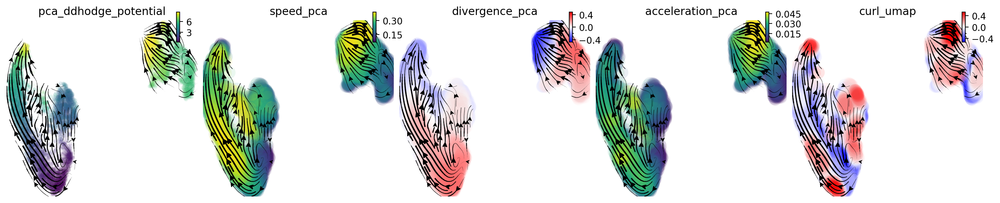

In [28]:
import matplotlib.pyplot as plt
fig1, f1_axes = plt.subplots(ncols=5, nrows=1, constrained_layout=True, figsize=(15, 3))
f1_axes
f1_axes[0] = dyn.pl.streamline_plot(adata, color='pca_ddhodge_potential', pointsize=0.1, alpha = 0.7, ax=f1_axes[0], quiver_length=6, quiver_size=6, save_show_or_return='return')
f1_axes[1] = dyn.pl.streamline_plot(adata, color='speed_pca', ax=f1_axes[1], quiver_length=12, quiver_size=12, save_show_or_return='return')
f1_axes[2] = dyn.pl.streamline_plot(adata, color='divergence_pca', ax=f1_axes[2], save_show_or_return='return', cmap='bwr', s_kwargs_dict= {"sym_c": True})
f1_axes[3] = dyn.pl.streamline_plot(adata, color='acceleration_pca', ax=f1_axes[3], save_show_or_return='return')
f1_axes[4] = dyn.pl.streamline_plot(adata, color='curl_umap', ax=f1_axes[4], save_show_or_return='return', cmap='bwr', s_kwargs_dict= {"sym_c": True})
plt.savefig(dpi=300, fname='./BM_vector_calculus.png')

In [29]:
example_genes = ['Camp']
import numpy as np 

dyn.pl.scatters(adata, x=np.repeat('pca_ddhodge_potential', 1),
                     y=example_genes, layer='X_spliced', color='pca_ddhodge_potential', 
                     background='white', figsize=(3, 3), save_show_or_return='save',
                     pointsize=0.4, ncols=1, alpha = 0.7, 
                     save_kwargs={'prefix': 'BM_potential', 'ext': 'png', "bbox_inches": None})

Saving figure to /lab/solexa_weissman/xqiu/proj/Aristotle/dynamo-tutorials/BM_potential_dyn_savefig.png...
Done


<Figure size 300x300 with 0 Axes>

/home/xqiu/python37test-env/lib/python3.7/site-packages/dynamo_release-1.0.0-py3.7.egg/dynamo/plot/scVectorField.py:1147: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


<Figure size 600x400 with 0 Axes>

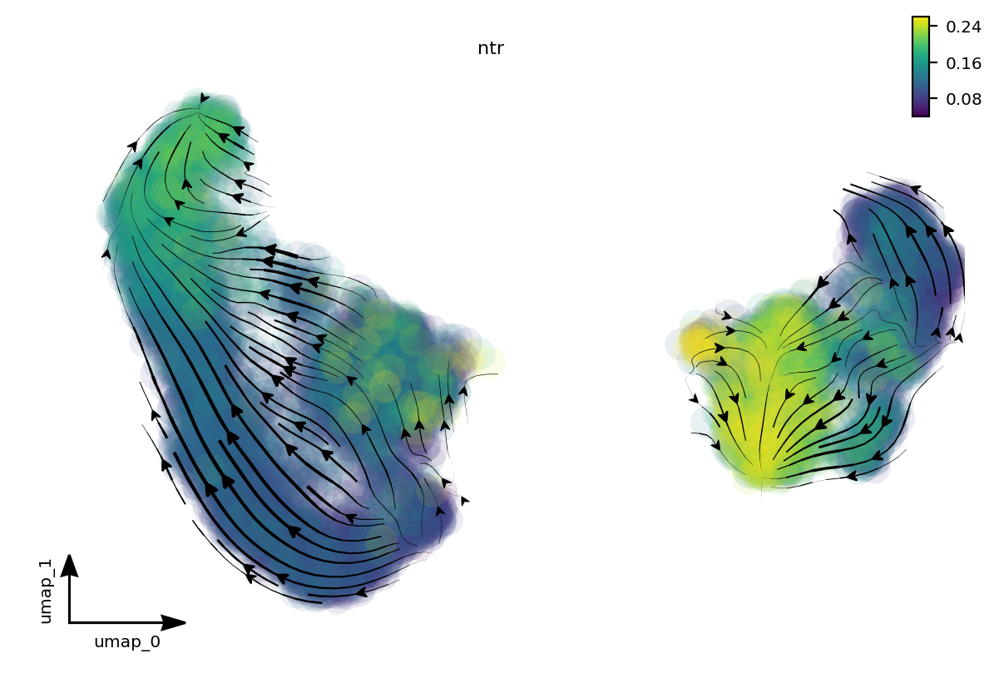

In [37]:
# # run dynamo determinstic 

# # run dynamo to get RNA velocity 

# dyn.configuration.set_figure_params('dynamo', background='white')

# adata_det = dyn.sample_data.BM()

# dyn.pp.recipe_monocle(adata_det, n_top_genes=1000, fg_kwargs={'shared_count': 20})

# dyn.tl.dynamics(adata_det, model='deterministic')

# dyn.tl.reduceDimension(adata_det, n_pca_components=30)

# dyn.tl.cell_velocities(adata_det, method='pearson', other_kernels_dict={'transform': 'sqrt'})
dyn.pl.streamline_plot(adata_det, basis='umap', show_legend='on data', show_arrowed_spines=True)


/home/xqiu/python37test-env/lib/python3.7/site-packages/dynamo_release-1.0.0-py3.7.egg/dynamo/plot/scVectorField.py:1147: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


<Figure size 600x400 with 0 Axes>

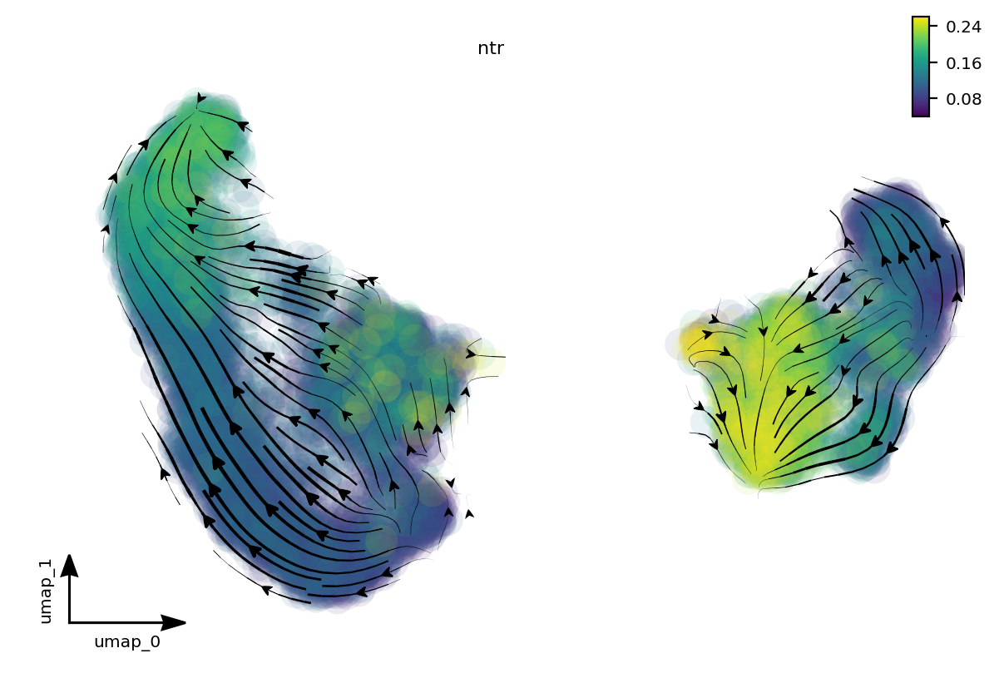

In [35]:
# run dynamo nb 


# run dynamo to get RNA velocity 

dyn.configuration.set_figure_params('dynamo', background='white')

adata_nb = dyn.sample_data.BM()

dyn.pp.recipe_monocle(adata_nb, n_top_genes=1000, fg_kwargs={'shared_count': 20})

dyn.tl.dynamics(adata_nb, est_method='negbin')

dyn.tl.reduceDimension(adata_nb, n_pca_components=30)

dyn.tl.cell_velocities(adata_nb, method='pearson', other_kernels_dict={'transform': 'sqrt'})
dyn.pl.streamline_plot(adata_nb, color=['ntr'], basis='umap', show_legend='on data', show_arrowed_spines=True)


In [34]:
adata.var.use_for_transition.sum(), adata_det.var.use_for_transition.sum(), adata_nb.var.use_for_transition.sum()

(545, 558, 560)

In [38]:
dyn.cleanup(adata)
dyn.cleanup(adata_det)
dyn.cleanup(adata_nb)

AnnData object with n_obs × n_vars = 6667 × 24421
    obs: 'nGenes', 'nCounts', 'pMito', 'use_for_pca', 'unspliced_Size_Factor', 'initial_unspliced_cell_size', 'Size_Factor', 'initial_cell_size', 'spliced_Size_Factor', 'initial_spliced_cell_size', 'ntr', 'cell_cycle_phase'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'nCells', 'nCounts', 'pass_basic_filter', 'log_m', 'log_cv', 'score', 'use_for_pca', 'frac', 'ntr', 'beta', 'gamma', 'half_life', 'alpha_b', 'alpha_r2', 'gamma_b', 'gamma_r2', 'gamma_logLL', 'delta_b', 'delta_r2', 'bs', 'bf', 'uu0', 'ul0', 'su0', 'sl0', 'U0', 'S0', 'total0', 'use_for_dynamics', 'use_for_transition'
    uns: 'pp', 'velocyto_SVR', 'PCs', 'explained_variance_ratio_', 'pca_mean', 'pca_fit', 'feature_selection', 'cell_phase_genes', 'dynamics', 'neighbors', 'umap_fit', 'grid_velocity_umap'
    obsm: 'X_pca', 'X', 'cell_cycle_scores', 'X_umap', 'velocity_umap'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced', 'X_unspliced', 'X_spliced', 

In [39]:
adata.write_h5ad('./data/bh_dynamo_stochastic.h5ad')
adata_det.write_h5ad('./data/bh_dynamo_det.h5ad')
adata_nb.write_h5ad('./data/bh_dynamo_nb.h5ad')

/home/xqiu/python37test-env/lib/python3.7/site-packages/anndata/_io/h5ad.py:170: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  write_array(f, key, np.array(value), dataset_kwargs=dataset_kwargs)
